In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import rc
# %matplotlib inline

# Configurable parameters for pure pursuit
+ How fast do you want the robot to move? It is fixed at $v_{max}$ in this exercise
+ When can we declare the goal has been reached?
+ What is the lookahead distance? Determines the next position on the reference path that we want the vehicle to catch up to

In [2]:
vmax = 0.75
goal_threshold = 0.05
lookahead = 3.0

In [3]:
#You know what to do!
def simulate_unicycle(pose, v,w, dt=0.1):
    x, y, t = pose
    return x + v*np.cos(t)*dt, y + v*np.sin(t)*dt, t+w*dt

In [4]:
class PurePursuitTracker(object):
    def __init__(self, x, y, v, lookahead = 3.0):
        """
        Tracks the path defined by x, y at velocity v
        x and y must be numpy arrays
        v and lookahead are floats
        """
        self.length = len(x)
        self.ref_idx = 0 #index on the path that tracker is to track
        self.lookahead = lookahead
        self.x, self.y = x, y
        self.v, self.w = v, 0

    def update(self, xc, yc, theta):
        """
        Input: xc, yc, theta - current pose of the robot
        Update v, w based on current pose
        Returns True if trajectory is over.
        """
        
        #Calculate ref_x, ref_y using current ref_idx
        #Check if we reached the end of path, then return TRUE
        #Two conditions must satisfy
        #1. ref_idx exceeds length of traj
        #2. ref_x, ref_y must be within goal_threshold
        # Write your code to check end condition

        ref_x, ref_y = self.x[self.ref_idx], self.y[self.ref_idx]
        goal_x, goal_y = self.x[-1], self.y[-1]
        if np.linalg.norm([xc-goal_x, yc-goal_y]) < goal_threshold:
                return True
        
        #End of path has not been reached
        #update ref_idx using np.hypot([ref_x-xc, ref_y-yc]) < lookahead
        # One additional constraint is to prevent the tracker from stoping before reaching target
        if self.ref_idx < self.length and np.hypot(ref_x-xc,ref_y-yc) < self.lookahead:
            self.ref_idx +=1
        #Find the anchor point
        # this is the line we drew between (0, 0) and (x, y)
        anchor = np.asarray([ref_x - xc, ref_y - yc])
        #Remember right now this is drawn from current robot pose
        #we have to rotate the anchor to (0, 0, pi/2)
        #code is given below for this
        theta = np.pi/2 - theta
        rot = np.asarray([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])
        anchor = np.dot(rot, anchor)
        
        L = np.sqrt(anchor[0] ** 2 + anchor[1] **2) # dist to reference path
        X = anchor[0] #cross-track error
        #from the derivation in notes, plug in the formula for omega
        self.w = -2*self.v*X/(L**2)
        
        if self.ref_idx >= self.length:
            self.ref_idx = self.length - 1 # To avoid possible out of bounds error
        
        return False

## Visualize given trajectory

100


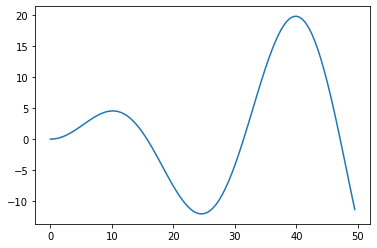

In [5]:
x = np.arange(0, 50, 0.5)
y = [np.sin(idx / 5.0) * idx / 2.0 for idx in x]

#write code here
print(len(x))
plt.figure()
plt.plot(x,y)
plt.show()

## Run the tracker simulation

1. Instantiate the tracker class
2. Initialize some starting pose
3. Simulate robot motion 1 step at a time - get $v$, $\omega$ from tracker, predict new pose using $v$, $\omega$, current pose in simulate_unicycle()
4. Stop simulation if tracker declares that end-of-path is reached
5. Record all parameters

In [6]:
#write code to instantiate the tracker class
tracker = PurePursuitTracker(x,y,vmax) 
pose = -1, 0, np.pi/2 #arbitrary initial pose
x0,y0,t0 = pose # record it for plotting
traj =[]
while True:
    #write the usual code to obtain successive poses
    pose = simulate_unicycle(pose, tracker.v, tracker.w)
    if tracker.update(*pose):
        print("ARRIVED!!")    
        break
    traj.append([*pose, tracker.w, tracker.ref_idx])

ARRIVED!!


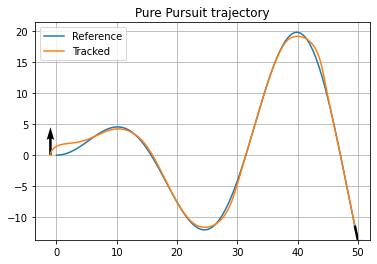

In [7]:
xs,ys,ts,ws,ids = zip(*traj)
plt.figure()
plt.plot(x,y,label='Reference')
plt.quiver(x0,y0, np.cos(t0), np.sin(t0),scale=12)
plt.plot(xs,ys,label='Tracked')
x0,y0,t0 = pose
plt.quiver(x0,y0, np.cos(t0), np.sin(t0),scale=12)
plt.title('Pure Pursuit trajectory')
plt.legend()
plt.grid()

# Visualize curvature

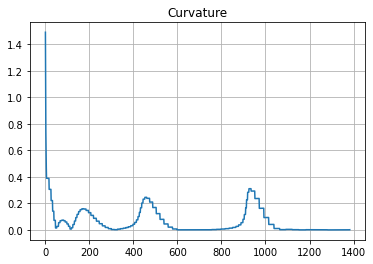

In [8]:
plt.figure()
plt.title('Curvature')
plt.plot(np.abs(ws))
plt.grid()


## Animate

Make a video to plot the current pose of the robot and reference pose it is trying to track. You can use funcAnimation in matplotlib

1384


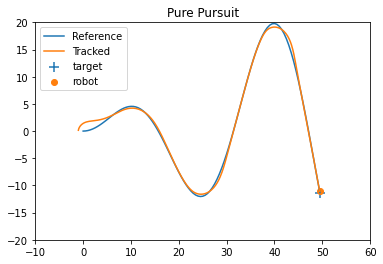

In [9]:
pose = -1, 0, np.pi/2 #arbitrary initial pose
x0,y0,t0 = pose # record it for plotting

print(len(traj))

fig, ax = plt.subplots()
ax.plot(x,y,label='Reference')
x_target = x[traj[0][4]]
y_target = y[traj[0][4]]
scatter_target = ax.scatter(x_target,y_target,marker="+",s=100, label="target")
scatter_current = ax.scatter(x_target,y_target,label="robot")
plt.title("Pure Pursuit")


ax.set_xlim(-10,60)
ax.set_ylim(-20,20)
    
x_data = []
y_data = []
line = ax.plot(x_data,y_data, label="Tracked")[0]
def anim(i):
    i = int(i)

    x_data.append(traj[i][0])
    y_data.append(traj[i][1])
    line.set_xdata(x_data)
    line.set_ydata(y_data)
    x_target = x[traj[i][4]]
    y_target = y[traj[i][4]]
    scatter_target.set_offsets(np.array([[x_target, y_target]]))
    scatter_current.set_offsets(np.array([[traj[i][0], traj[i][1]]]))
    return line,

animation = FuncAnimation(fig,func=anim,frames=np.arange(1,len(traj),4),interval=5)


rc('animation', html='jshtml')
rc('animation', embed_limit=4096)

ax.legend()

animation

## Effect of noise in simulations

What happens if you add a bit of Gaussian noise to the simulate_unicycle() output? Is the tracker still robust?

The noise signifies that $v$, $\omega$ commands did not get realized exactly


In [10]:
def simulate_noisy_unicycle(pose, v,w, dt=0.1):
    x, y, t = pose
    return x + v*np.cos(t)*dt + np.random.normal(0,0.04), y + v*np.sin(t)*dt + np.random.normal(0,0.04), t+w*dt + np.random.normal(0,0.04)

In [11]:
#write code to instantiate the tracker class
tracker = PurePursuitTracker(x,y,vmax) 
pose = -1, 0, np.pi/2 #arbitrary initial pose
x0,y0,t0 = pose # record it for plotting
traj =[]
while True:
    #write the usual code to obtain successive poses
    pose = simulate_noisy_unicycle(pose, tracker.v, tracker.w)
    if tracker.update(*pose):
        print("ARRIVED!!")    
        break
    traj.append([*pose, tracker.w, tracker.ref_idx])

ARRIVED!!


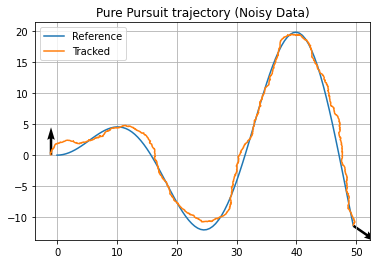

In [12]:
xs,ys,ts,ws,ids = zip(*traj)
plt.figure()
plt.plot(x,y,label='Reference')
plt.quiver(x0,y0, np.cos(t0), np.sin(t0),scale=12)
plt.plot(xs,ys,label='Tracked')
x0,y0,t0 = pose
plt.quiver(x0,y0, np.cos(t0), np.sin(t0),scale=12)
plt.title('Pure Pursuit trajectory (Noisy Data)')
plt.legend()
plt.grid()
plt.show()

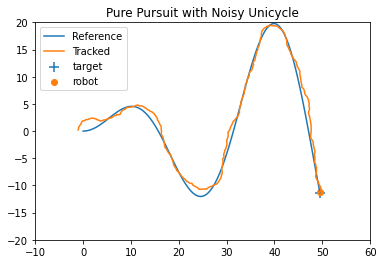

In [13]:
pose = -1, 0, np.pi/2 #arbitrary initial pose
x0,y0,t0 = pose # record it for plotting

plt.close()
fig, ax = plt.subplots()
plt.plot(x,y,label='Reference')
x_target = x[traj[0][4]]
y_target = y[traj[0][4]]
scatter_target = plt.scatter(x_target,y_target,marker="+", s=100,label="target")
scatter_current = plt.scatter(x_target,y_target,label="robot")
plt.title("Pure Pursuit with Noisy Unicycle")

ax.set_xlim(-10,60)
ax.set_ylim(-20,20)

x_data = []
y_data = []
line = ax.plot(x_data,y_data, label="Tracked")[0]

def anim(i):
    i = int(i)
    x_data.append(traj[i][0])
    y_data.append(traj[i][1])
    line.set_xdata(x_data)
    line.set_ydata(y_data)
    x_target = x[traj[i][4]]
    y_target = y[traj[i][4]]

    scatter_target.set_offsets(np.array([[x_target, y_target]]))
    scatter_current.set_offsets(np.array([[traj[i][0], traj[i][1]]]))

animation = FuncAnimation(fig,func=anim,frames=np.arange(1,len(traj),4),interval=5)

ax.legend()

animation

I consider the tracker as robust though tracker is slightly snaking